<a href="https://colab.research.google.com/github/sjkim-audio/Bass-separator/blob/main/notebooks/transcription/04_tracking_by_CREPE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# =================================================================
# [Bass Separator] Integrated Setup & Initialization
# =================================================================
from google.colab import drive
import os
import sys

# 1. 구글 드라이브 마운트
drive.mount('/content/drive')

# 2. 프로젝트 최신화 (Git Clone / Pull)
PROJECT_NAME = "Bass-separator"
REPO_URL = "https://github.com/sjkim-audio/Bass-separator.git"
PROJECT_PATH = f"/content/{PROJECT_NAME}"

if not os.path.exists(PROJECT_PATH):
    print(f"📦 Cloning repository... ({PROJECT_NAME})")
    !git clone {REPO_URL}
else:
    print(f"🔄 Updating repository... (Git Pull)")
    !cd {PROJECT_PATH} && git pull

# 3. 작업 경로 설정
if PROJECT_PATH not in sys.path:
    sys.path.append(PROJECT_PATH)
os.chdir(PROJECT_PATH)
print(f"📂 Working Directory: {os.getcwd()}")

# 4. [src] 모듈을 이용한 환경 구축 및 데이터 로드
try:
    from src.env_setup import init_colab_env
    from src.utils import load_data_from_drive

    # A. 설치 및 환경 설정 (FFmpeg, Demucs, 호환성 해결)
    init_colab_env()

    # B. 데이터셋 로드
    MY_DRIVE_PATH = "/content/drive/MyDrive/Bass_separator/dataset"
    load_data_from_drive(MY_DRIVE_PATH)

except ImportError as e:
    print(f"⚠️ src 모듈 로드 실패: {e}")
    print("   Git Clone이 정상적으로 되었는지 확인해주세요.")

# 5. 자주 쓰는 라이브러리 임포트 (편의용)
import librosa
import librosa.display
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.signal
import soundfile as sf
from IPython.display import Audio, display
import subprocess
print("📚 Standard Libraries Imported.")

Mounted at /content/drive
📦 Cloning repository... (Bass-separator)
Cloning into 'Bass-separator'...
remote: Enumerating objects: 509, done.
remote: Counting objects: 100% (220/220), done.
remote: Compressing objects: 100% (162/162), done.
remote: Total 509 (delta 155), reused 58 (delta 58), pack-reused 289 (from 2)
Receiving objects: 100% (509/509), 242.76 MiB | 21.25 MiB/s, done.
Resolving deltas: 100% (272/272), done.
📂 Working Directory: /content/Bass-separator

🔧 [System] 오디오 처리 환경 점검 및 초기화...

✅ FFmpeg가 이미 설치되어 있습니다.
⚠️ Demucs가 감지되지 않아 설치합니다.
📦 Demucs 라이브러리 설치 진행 중...
✅ Demucs 라이브러리 설치 완료.
✅ 오디오 코덱 라이브러리(torchaudio, torchcodec) 정상 작동.

🎉 모든 환경 설정이 준비되었습니다!
🚀 데이터 복사 시작...
   📂 Source: /content/drive/MyDrive/Bass_separator/dataset
   📂 Dest  : ./dataset
🎉 데이터 준비 완료! (총 2개 파일 복사됨)
📚 Standard Libraries Imported.


In [ ]:
!pip install torchcrepe

In [6]:
# 분석할 오디오 파일의 경로를 입력
target_file_path = "/content/drive/MyDrive/Bass_separator/dataset/기타 베이스 분리 예제 2.wav"

# Demucs로 베이스 트랙 분리
print("🚀 Demucs 분리 시작...")

# 파일명 추출 (확장자 제외)
filename = os.path.splitext(os.path.basename(target_file_path))[0]

# Demucs 실행 (htdemucs 모델 사용)
cmd = f'demucs -n htdemucs "{target_file_path}"'
process = subprocess.run(cmd, shell=True, capture_output=True, text=True, check=False)

# 분리된 베이스 파일 경로 자동 탐색
# Demucs 기본 출력 경로: separated/htdemucs/파일명/bass.wav
bass_stem_path = os.path.join('separated', 'htdemucs', filename, 'bass.wav')
print(f"✅ 분리 완료! 베이스 트랙 경로: {bass_stem_path}")

# 오디오 재생
print("🎧 분리된 베이스 트랙 듣기:")
display(Audio(bass_stem_path))

🚀 Demucs 분리 시작...
✅ 분리 완료! 베이스 트랙 경로: separated/htdemucs/기타 베이스 분리 예제 2/bass.wav
🎧 분리된 베이스 트랙 듣기:


In [ ]:
import torchcrepe
import torch
import torchcrepe.decode

def get_f0_crepe(audio, sr, hop_length=512, fmin=30, fmax=500, smooth_kernel=3):
    """
    [Updated] 하이패스 필터가 적용된 Robust 피치 트래커
    """

    # 0-1. [추가됨] High-pass Filter (40Hz 이하의 웅웅거리는 노이즈 제거)
    # 베이스의 최저음(Low E)이 약 41Hz이므로, 35Hz 정도로 컷오프를 잡으면 안전합니다.
    # 5현 베이스(Low B=30Hz)라도 노이즈가 심하면 35~40Hz로 자르는 게 인식에 유리합니다.
    sos = scipy.signal.butter(4, 35, 'hp', fs=sr, output='sos')
    audio = scipy.signal.sosfilt(sos, audio)

    # 0-2. 오디오 강제 정규화
    if np.max(np.abs(audio)) < 1e-6:
        return np.zeros(len(audio) // hop_length)
    audio = librosa.util.normalize(audio)

    # 1. GPU 설정
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    # 2. 오디오 텐서 변환 (명시적으로 float32 지정)
    # numpy array `audio` is usually float32 from librosa, ensure torch tensor is also float32
    audio_tensor = torch.tensor(audio, dtype=torch.float32).unsqueeze(0).to(device)


    # 3. CREPE 실행
    # fmin을 40으로 살짝 올려서 노이즈 회피를 시도합니다.
    f0, confidence = torchcrepe.predict(
        audio_tensor,
        sr,
        hop_length=hop_length,
        fmin=40,   # [수정] 30 -> 40 (노이즈 회피)
        fmax=fmax,
        model='full',
        decoder=torchcrepe.decode.argmax,
        return_periodicity=True,
        device=device,
        batch_size=2048
    )

    f0 = f0.squeeze().cpu().numpy()
    confidence = confidence.squeeze().cpu().numpy()

    # 4. [복구] 신뢰도 필터 다시 활성화 (노이즈가 31Hz로 잡히는 것 방지)
    # 신뢰도가 너무 낮으면(0.1 미만) 그냥 0(무음) 처리하는 게 낫습니다.
    f0[confidence < 0.15] = np.nan

    # 5. 미디언 필터
    if smooth_kernel > 1:
        f0_series = pd.Series(f0)
        f0 = f0_series.rolling(window=smooth_kernel, center=True, min_periods=1).median().values

    return f0


📂 Loading audio from: separated/htdemucs/기타 베이스 분리 예제 2/bass.wav
   Audio Loaded: 874955 samples (Normalized)
🚀 Running CREPE (Threshold: 0.2)...
✅ Analysis Complete!
   - Total Frames: 5469
   - Valid Frames: 5437 (99.4%)
   - Min Pitch: 39.74 Hz
   - Max Pitch: 398.51 Hz


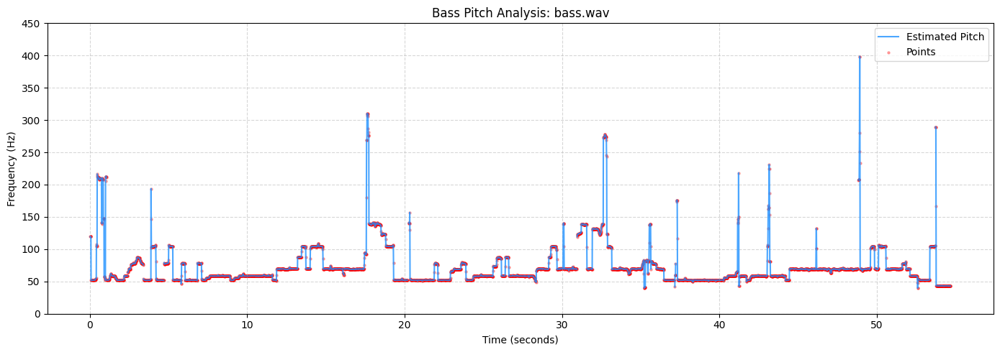

In [14]:
# ==========================================
# 0. 설정 (디버깅 모드)
# ==========================================
# 신뢰도 기준을 대폭 낮춤 (0.6 -> 0.2)
CONFIDENCE_THRESHOLD = 0.2
SMOOTH_KERNEL = 5

# ==========================================
# 1. 오디오 파일 로드 및 정규화
# ==========================================
if not os.path.exists(bass_stem_path):
    print(f"❌ 파일이 존재하지 않습니다: {bass_stem_path}")
else:
    print(f"📂 Loading audio from: {bass_stem_path}")

    # 16kHz로 로드
    target_sr = 16000
    y, sr = librosa.load(bass_stem_path, sr=target_sr)

    # [핵심 해결책 1] 오디오 정규화 (최대 볼륨을 1.0으로 키움)
    # 소리가 너무 작으면 피치 감지가 안 됩니다.
    y = librosa.util.normalize(y)

    print(f"   Audio Loaded: {len(y)} samples (Normalized)")

    # ==========================================
    # 2. CREPE 피치 트래킹 실행
    # ==========================================
    print(f"🚀 Running CREPE (Threshold: {CONFIDENCE_THRESHOLD})...")

    f0_crepe = get_f0_crepe(
        y, sr,
        hop_length=160,    # 10ms
        fmin=30,           # Bass Low B
        fmax=400,          # Bass High Note
        # confidence_threshold=CONFIDENCE_THRESHOLD, <-- 임시 삭제 처리
        smooth_kernel=SMOOTH_KERNEL
    )

    # ==========================================
    # 3. 결과 진단 (디버깅)
    # ==========================================
    # 유효한(NaN이 아닌) 데이터 개수 확인
    valid_count = np.count_nonzero(~np.isnan(f0_crepe))
    total_count = len(f0_crepe)

    print(f"✅ Analysis Complete!")
    print(f"   - Total Frames: {total_count}")
    print(f"   - Valid Frames: {valid_count} ({(valid_count/total_count)*100:.1f}%)")

    if valid_count == 0:
        print("⚠️ [경고] 유효한 피치가 하나도 없습니다! 임계값(Threshold)을 더 낮추거나 오디오를 확인하세요.")
    else:
        print(f"   - Min Pitch: {np.nanmin(f0_crepe):.2f} Hz")
        print(f"   - Max Pitch: {np.nanmax(f0_crepe):.2f} Hz")

        # ==========================================
        # 4. 시각화
        # ==========================================
        plt.figure(figsize=(14, 5))

        # 시간축 생성
        # len(f0_crepe)와 정확히 맞추기 위해 linspace 사용
        times = np.linspace(0, len(y) / sr, len(f0_crepe))

        plt.plot(times, f0_crepe, label='Estimated Pitch', color='dodgerblue', linewidth=1.5, alpha=0.8)

        # 산점도(Scatter)로 끊긴 구간 추정 가능
        plt.scatter(times, f0_crepe, s=5, color='red', alpha=0.3, label='Points')

        plt.title(f"Bass Pitch Analysis: {os.path.basename(bass_stem_path)}")
        plt.xlabel("Time (seconds)")
        plt.ylabel("Frequency (Hz)")
        plt.ylim(0, 450)
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.legend()
        plt.tight_layout()
        plt.show()

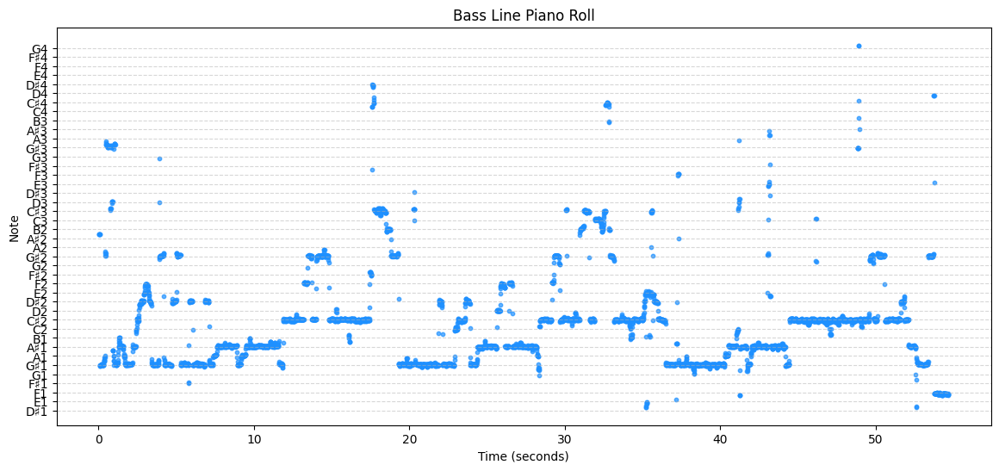

In [19]:
def plot_piano_roll(f0_array, sr, hop_length):
    """
    Hz/MIDI 배열을 피아노 롤 형태로 시각화 (음이름 라벨 포함)
    """
    # 1. Hz -> MIDI 변환
    # 0이나 NaN은 제외하고 변환
    midi_notes = np.zeros_like(f0_array)
    mask = (f0_array > 0) & (~np.isnan(f0_array))
    midi_notes[mask] = librosa.hz_to_midi(f0_array[mask])

    # 2. 시간축 생성
    times = librosa.frames_to_time(np.arange(len(f0_array)), sr=sr, hop_length=hop_length)

    # 3. 그래프 그리기
    plt.figure(figsize=(14, 6))

    # 유효한 데이터만 산점도로 표시
    plt.scatter(times[mask], midi_notes[mask], c='dodgerblue', s=10, alpha=0.7, label='Detected Notes')

    # 4. Y축을 음이름(Note Name)으로 변경 (핵심!)
    # 데이터에 존재하는 음역대만 라벨링
    min_note = int(np.min(midi_notes[mask]))
    max_note = int(np.max(midi_notes[mask]))

    # Y축 눈금 설정 (반음 단위)
    yticks = np.arange(min_note, max_note + 1)
    yticklabels = [librosa.midi_to_note(n) for n in yticks]

    plt.yticks(yticks, yticklabels)
    plt.grid(axis='y', linestyle='--', alpha=0.5)

    plt.title("Bass Line Piano Roll")
    plt.xlabel("Time (seconds)")
    plt.ylabel("Note")
    plt.show()

# 사용 예시 (아까 구한 f0_crepe 사용)
plot_piano_roll(f0_crepe, sr=16000, hop_length=160)